<a href="https://colab.research.google.com/github/Hajara-Waseem/LAB-TASK-04_DiP/blob/main/TASK_04_DIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
import cv2
import numpy as np
from matplotlib import pyplot as plt

### Step 1: Upload your image files
Run the cell below, and a file browser will pop up allowing you to select and upload your images. Once uploaded, their names will be printed.

In [ ]:
uploaded = files.upload()

Saving 83328702-5b91-4a30-bbce-fcf00cf832ff.jfif to 83328702-5b91-4a30-bbce-fcf00cf832ff.jfif
Saving Results-obtained-for-the-noise-level-10-corrupted-for-the-512x512-parrot-color-image.ppm to Results-obtained-for-the-noise-level-10-corrupted-for-the-512x512-parrot-color-image.ppm


### Step 2: Load the uploaded images
Replace `"your_first_image.webp"` and `"your_second_image.ppm"` with the exact filenames you uploaded in the previous step. Note that your `ppm` file might require specific handling or conversion depending on its exact format if `cv2.imread` struggles with it directly.

Image 1 (beautiful-random-distributed-noise-different-colors-beautiful-random-distributed-noise-different-colors-300346680.webp) loaded successfully with shape: (533, 800, 3)


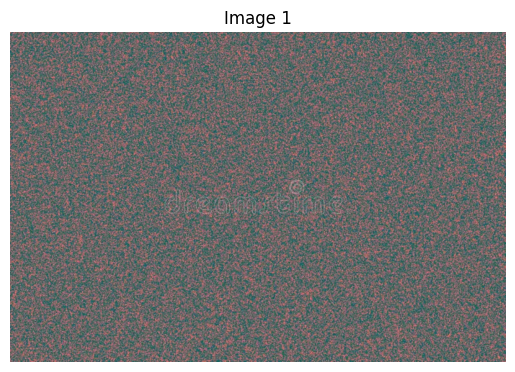

Image 2 (Results-obtained-for-the-noise-level-10-corrupted-for-the-512x512-parrot-color-image.ppm) loaded successfully with shape: (491, 491, 3)


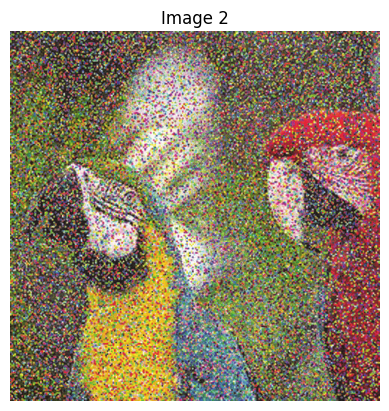

In [ ]:
# Assuming your uploaded files are named similar to your original request:
image_path_1 = "beautiful-random-distributed-noise-different-colors-beautiful-random-distributed-noise-different-colors-300346680.webp" # Replace with actual uploaded filename
image_path_2 = "Results-obtained-for-the-noise-level-10-corrupted-for-the-512x512-parrot-color-image.ppm" # Replace with actual uploaded filename

# Load the images
img1 = cv2.imread(image_path_1)
img2 = cv2.imread(image_path_2)

# Check if images were loaded successfully
if img1 is not None:
    print(f"Image 1 ({image_path_1}) loaded successfully with shape: {img1.shape}")
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title("Image 1")
    plt.axis('off')
    plt.show()
else:
    print(f"Error loading Image 1: {image_path_1}")

if img2 is not None:
    print(f"Image 2 ({image_path_2}) loaded successfully with shape: {img2.shape}")
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title("Image 2")
    plt.axis('off')
    plt.show()
else:
    print(f"Error loading Image 2: {image_path_2}")


### Step 3: Apply Mean, Median, and Gaussian Filters

Now, let's apply different spatial filters to `img1` and `img2`. We'll use a kernel size of `(5, 5)` for the mean and Gaussian filters, and `5` for the median filter (which requires an odd integer for the kernel size).

Each filter will be applied to both images, and the results will be displayed.


Applying filters to Image 1:


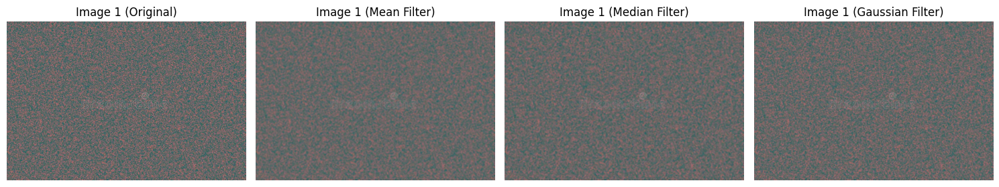


Applying filters to Image 2:


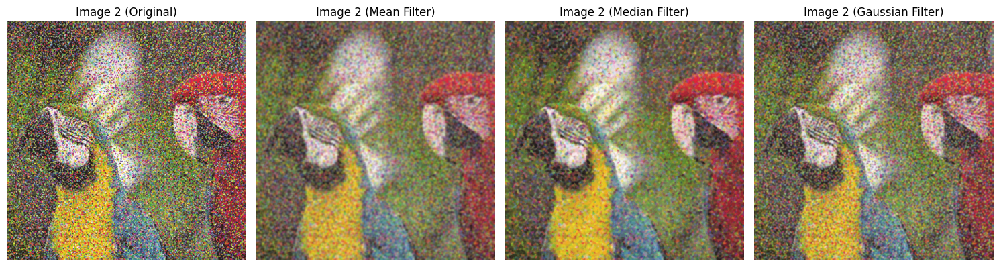

In [ ]:
# Define kernel sizes for the filters
kernel_size_mean_gaussian = (5, 5)
kernel_size_median = 5 # Must be an odd integer

images = {'Image 1': img1, 'Image 2': img2}

for name, image in images.items():
    if image is not None:
        print(f"\nApplying filters to {name}:")

        # Apply Mean Filter
        mean_filtered = cv2.blur(image, kernel_size_mean_gaussian)

        # Apply Median Filter
        median_filtered = cv2.medianBlur(image, kernel_size_median)

        # Apply Gaussian Filter
        gaussian_filtered = cv2.GaussianBlur(image, kernel_size_mean_gaussian, 0)

        # Display results for each image
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 4, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Original)')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(cv2.cvtColor(mean_filtered, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Mean Filter)')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Median Filter)')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(cv2.cvtColor(gaussian_filtered, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Gaussian Filter)')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print(f"Warning: {name} was not loaded successfully, skipping filter application.")

### Step 4: Apply Laplacian Filter for Sharpening

The Laplacian filter is a derivative filter used to highlight regions of rapid intensity change, effectively sharpening edges in an image. We will apply it to both `img1` and `img2`.


Applying Laplacian filter to Image 1:


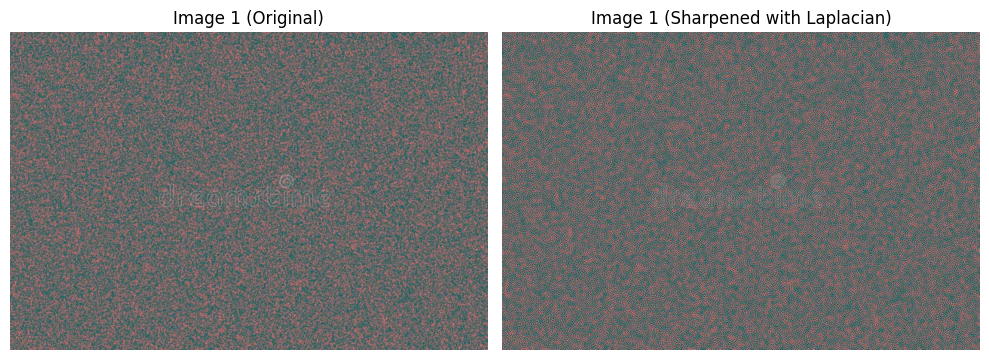


Applying Laplacian filter to Image 2:


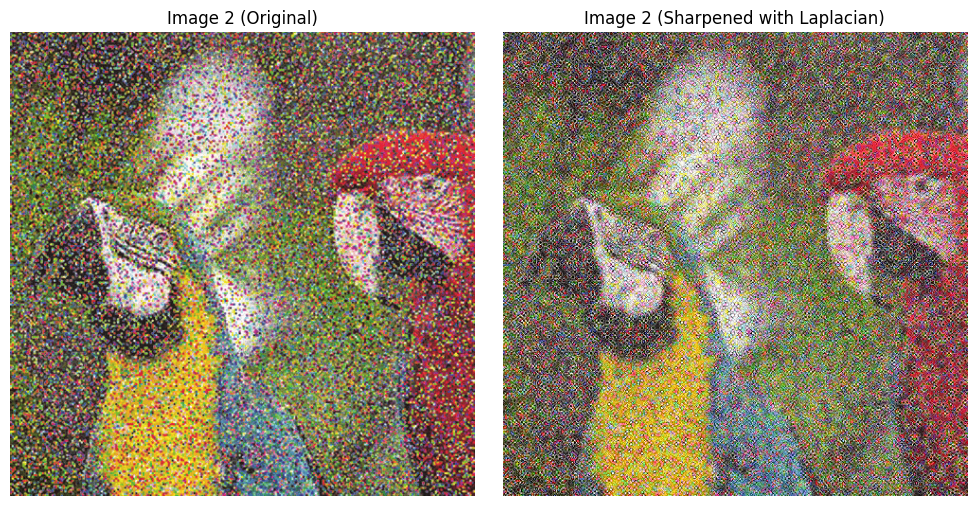

In [ ]:
images = {'Image 1': img1, 'Image 2': img2}

for name, image in images.items():
    if image is not None:
        print(f"\nApplying Laplacian filter to {name}:")

        # Convert image to grayscale first if it's not already, as Laplacian is typically applied to single-channel images
        # If the image is already grayscale, this conversion won't change it significantly
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Apply Laplacian filter
        # The ddepth parameter specifies the depth of the output image. cv2.CV_64F is often used to avoid saturation.
        laplacian = cv2.Laplacian(gray_image, cv2.CV_64F)

        # Convert back to uint8 and scale for display
        # The result of Laplacian can be negative, so we take the absolute value and convert to 8-bit.
        laplacian_8bit = cv2.convertScaleAbs(laplacian)

        # To sharpen the image, we can add the scaled Laplacian back to the original image.
        # This is one common way to achieve sharpening with Laplacian.
        # Make sure the original image is also in grayscale or converted to it for this step if working with a single channel.
        # For color images, it's often applied to each channel independently or after converting to grayscale.
        # For simplicity here, we'll just display the Laplacian result itself as a representation of edges, or add it to grayscale.

        # Let's try adding the Laplacian result to the original image for sharpening effect
        # This often requires careful scaling and may produce artifacts. A simpler display is the Laplacian magnitude.
        # For a more direct sharpening, we can add the high-pass filtered result (Laplacian) to the original.

        # If we want to sharpen the color image, a common approach is to convert to LAB color space, sharpen L channel, then convert back.
        # For this example, let's just display the edges detected by Laplacian and a simple sharpening effect if possible on grayscale.

        # Simple sharpening: original + k * laplacian
        # Convert original image to float for arithmetic operations, then back to uint8
        sharpened_image_float = image.astype(np.float32) + np.stack([laplacian, laplacian, laplacian], axis=2) # Apply Laplacian across all 3 channels for simplicity
        sharpened_image = np.clip(sharpened_image_float, 0, 255).astype(np.uint8)


        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Original)')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Sharpened with Laplacian)')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print(f"Warning: {name} was not loaded successfully, skipping filter application.")

### Step 5: Implement a 3x3 Custom Convolution Kernel

A convolution kernel (or filter) is a small matrix used for image processing. Each element in the kernel is a coefficient that determines how the pixel values in the input image are weighted and summed to produce the output pixel value. By changing the kernel's values, you can achieve different effects.

Let's define a custom 3x3 kernel for sharpening as an example, and then apply it to `img1` and `img2`.


Applying custom convolution kernel to Image 1:


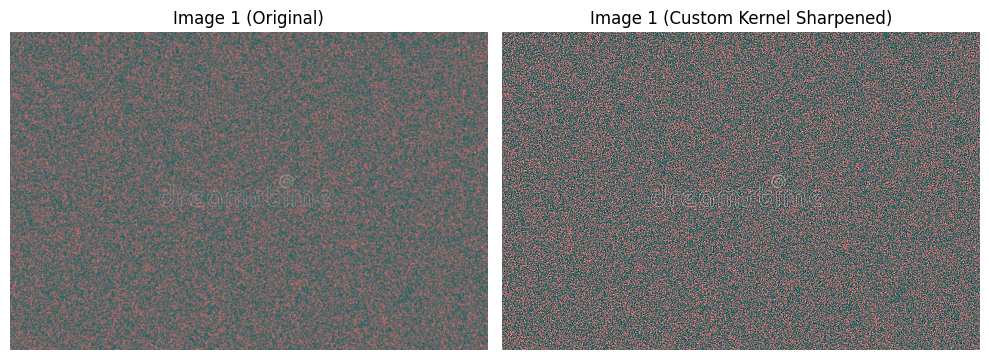


Applying custom convolution kernel to Image 2:


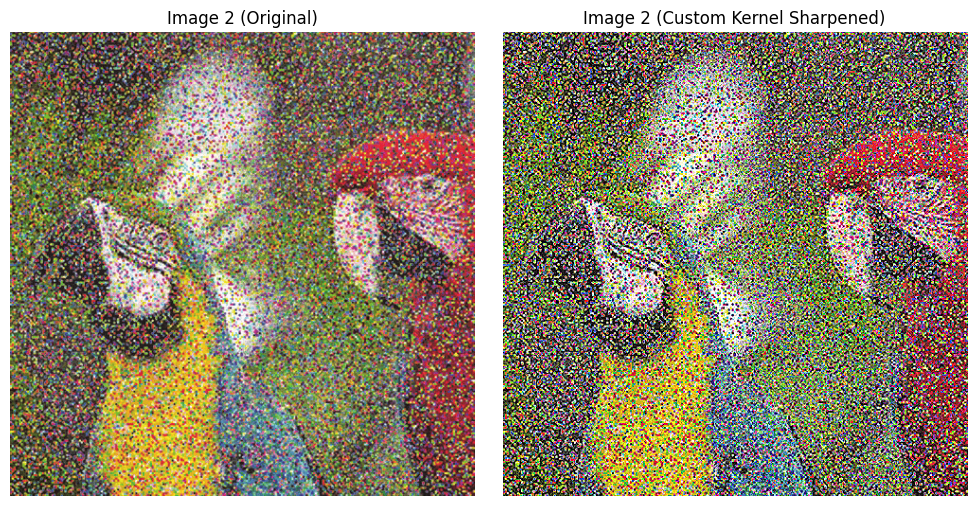

In [ ]:
# Define a custom 3x3 convolution kernel
# This is an example of a sharpening kernel
custom_sharpening_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
], dtype=np.float32)

# Another example: simple blur kernel
# custom_blur_kernel = np.array([
#     [1, 1, 1],
#     [1, 1, 1],
#     [1, 1, 1]
# ], dtype=np.float32) / 9

images = {'Image 1': img1, 'Image 2': img2}

for name, image in images.items():
    if image is not None:
        print(f"\nApplying custom convolution kernel to {name}:")

        # Apply the custom kernel
        # -1 indicates that the depth of the output image will be the same as the input image
        custom_filtered_image = cv2.filter2D(image, -1, custom_sharpening_kernel)

        # Display results
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Original)')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(custom_filtered_image, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Custom Kernel Sharpened)')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print(f"Warning: {name} was not loaded successfully, skipping custom kernel application.")

### Step 6: Compare Noise Removal of Each Filter

Now, let's visually compare the effectiveness of the Mean, Median, and Gaussian filters in removing noise from the original images. We'll display the original image next to its filtered versions to observe the differences.


Comparing noise removal for Image 1:


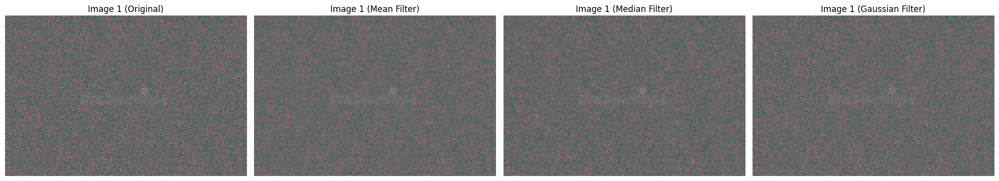


Comparing noise removal for Image 2:


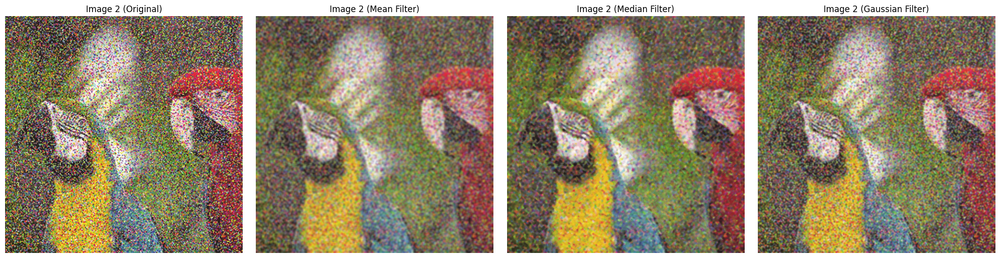

In [ ]:
# Re-using the kernel sizes defined previously
kernel_size_mean_gaussian = (5, 5)
kernel_size_median = 5

images = {'Image 1': img1, 'Image 2': img2}

for name, image in images.items():
    if image is not None:
        print(f"\nComparing noise removal for {name}:")

        # Apply Mean Filter
        mean_filtered = cv2.blur(image, kernel_size_mean_gaussian)

        # Apply Median Filter
        median_filtered = cv2.medianBlur(image, kernel_size_median)

        # Apply Gaussian Filter
        gaussian_filtered = cv2.GaussianBlur(image, kernel_size_mean_gaussian, 0)

        # Display results for comparison
        plt.figure(figsize=(20, 5))

        plt.subplot(1, 4, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Original)')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(cv2.cvtColor(mean_filtered, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Mean Filter)')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Median Filter)')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(cv2.cvtColor(gaussian_filtered, cv2.COLOR_BGR2RGB))
        plt.title(f'{name} (Gaussian Filter)')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print(f"Warning: {name} was not loaded successfully, skipping noise removal comparison.")

### Step 7: Identify Best Filter for Salt & Pepper vs. Gaussian Noise

Different types of noise respond best to different filters. Let's introduce Salt & Pepper noise and Gaussian noise to one of our original images and then apply the Mean, Median, and Gaussian filters to see which one performs best for each noise type.

In [ ]:
def add_salt_pepper_noise(image, prob):
    '''
    Add Salt & Pepper noise to image
    prob: probability (threshold) that determines the amount of noise
    '''
    output = np.zeros(image.shape, np.uint8)
    thres = 1 - prob
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = np.random.random()
            if rdn < prob:
                output[i][j] = [0, 0, 0] # Salt noise
            elif rdn > thres:
                output[i][j] = [255, 255, 255] # Pepper noise
            else:
                output[i][j] = image[i][j]
    return output

In [ ]:
def add_gaussian_noise(image, mean=0, var=0.01):
    '''
    Add Gaussian noise to image
    mean: mean of the Gaussian distribution
    var: variance of the Gaussian distribution
    '''
    sigma = var**0.5
    gaussian = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, gaussian)
    return noisy_image

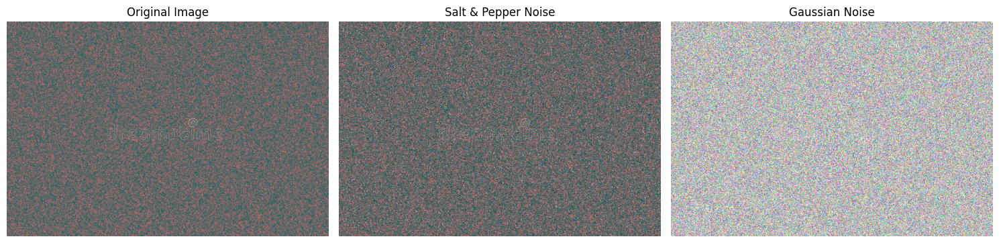

In [ ]:
selected_image = img1.copy() # Use a copy of one of the loaded images for demonstration

# Generate Salt & Pepper noisy image
salt_pepper_noisy_image = add_salt_pepper_noise(selected_image, 0.02)

# Generate Gaussian noisy image
gaussian_noisy_image = add_gaussian_noise(selected_image, mean=0, var=500) # Adjust var for more/less noise

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(salt_pepper_noisy_image, cv2.COLOR_BGR2RGB))
plt.title('Salt & Pepper Noise')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(gaussian_noisy_image, cv2.COLOR_BGR2RGB))
plt.title('Gaussian Noise')
plt.axis('off')
plt.tight_layout()
plt.show()

Now, let's apply the Mean, Median, and Gaussian filters to these noisy images and observe their effectiveness.


Filtering Salt & Pepper Noisy Image:


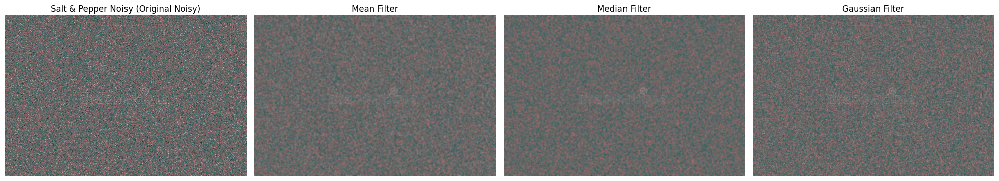


Filtering Gaussian Noisy Image:


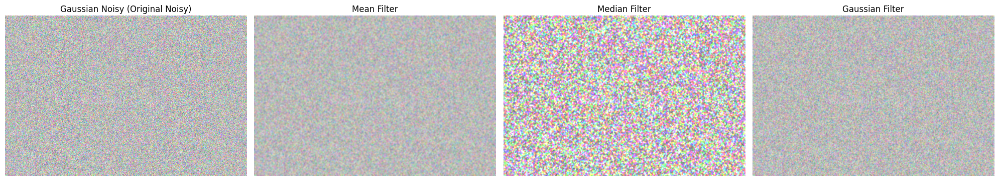

In [ ]:
kernel_size_mean_gaussian = (5, 5)
kernel_size_median = 5

noisy_images_to_filter = {
    'Salt & Pepper Noisy': salt_pepper_noisy_image,
    'Gaussian Noisy': gaussian_noisy_image
}

for name, noisy_image in noisy_images_to_filter.items():
    print(f"\nFiltering {name} Image:")

    # Apply Mean Filter
    mean_filtered = cv2.blur(noisy_image, kernel_size_mean_gaussian)

    # Apply Median Filter
    median_filtered = cv2.medianBlur(noisy_image, kernel_size_median)

    # Apply Gaussian Filter
    gaussian_filtered = cv2.GaussianBlur(noisy_image, kernel_size_mean_gaussian, 0)

    plt.figure(figsize=(20, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
    plt.title(f'{name} (Original Noisy)')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(cv2.cvtColor(mean_filtered, cv2.COLOR_BGR2RGB))
    plt.title('Mean Filter')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB))
    plt.title('Median Filter')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(cv2.cvtColor(gaussian_filtered, cv2.COLOR_BGR2RGB))
    plt.title('Gaussian Filter')
    plt.axis('off')

    plt.tight_layout()
    plt.show()